# - Image Processing with Pillow

In [67]:
#Download Image from lab
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

--2022-08-16 14:48:40--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 637192 (622K) [image/png]
Saving to: ‘baboon.png’

baboon.png          100%[===================>] 622.26K  1.81MB/s    in 0.3s    

2022-08-16 14:48:41 (1.81 MB/s) - ‘baboon.png’ saved [637192/637192]

--2022-08-16 14:48:41--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-c

In [2]:
#concatenate two images together
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

# 1)Image Files and Path

In [26]:
#we define my_image as filename of a file in this directory
my_image = "Doris_Wang.png"

- A **filename** consists of two parts: the name of the file and the extension, separated by a full stop (.). 
- The extension specifies the format of the Image. There are two popular image formats: Joint Photographic Expert Group image (or *.jpg, .jpeg*) and Portable Network Graphics (or .*png*). 

**Path:**
- Finding the path of your current working directory with Python's *os module*. 
- The os module provides functions to interact with the file system
 - creating or removing a directory (folder), 
 -listing its contents, 
 -changing and identifying the current working directory

In [27]:
import os
cwd = os.getcwd()
cwd 

'/content'

In [28]:
#find the path of the image
image_path = os.path.join(cwd, my_image)
image_path

'/content/Doris_Wang.png'

# 2) Load Image in Python

In [29]:
#The Image module provides functions to load images from and saving images to the file system.
from PIL import Image

In [30]:
image = Image.open(my_image)
type(image)

PIL.JpegImagePlugin.JpegImageFile

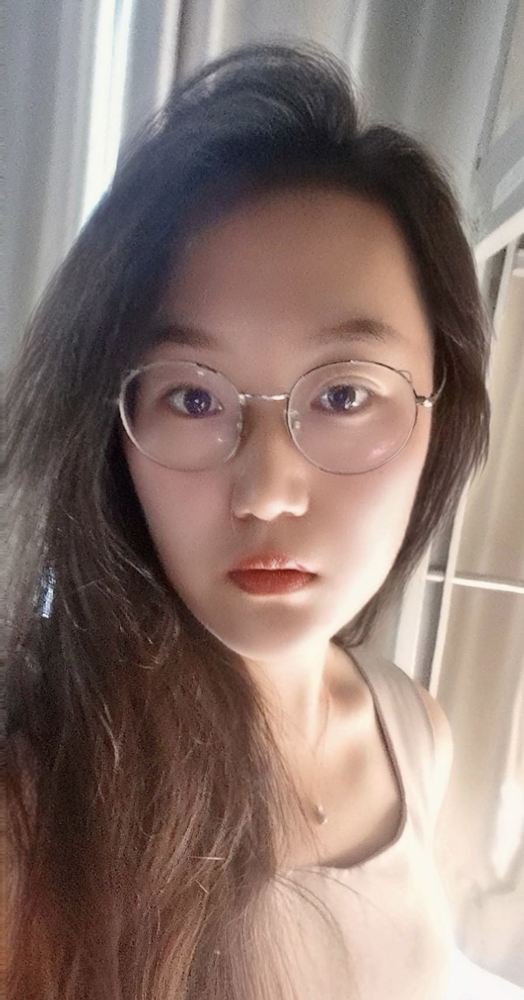

In [31]:
image

# 3)Plotting an Image

In [32]:
image.show() #this method may/may not work depending on settings

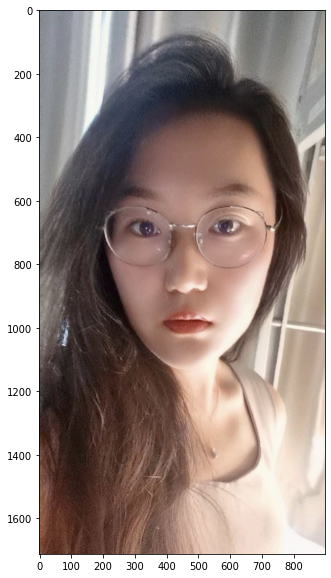

In [33]:
#plot image based on matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [34]:
image = Image.open(image_path)

In [35]:
print(image.size) #return width pixel and height pixel

(898, 1712)


In [36]:
print(image.mode) 

RGB


In [37]:
#The load method of PIL object reads the file content, decodes it, and expands the image into memory.
im = image.load() 

In [38]:
#We can then check the intensity of the image at the  𝑥 -th column and  𝑦 -th row:
x = 0
y = 1
im[y,x]

(135, 135, 143)

In [39]:
#save image
image.save("selfie.jpg")

# 4)Grayscale Images, Quantization and Color Channels
- Grayscale Images

In [40]:
#ImageOps contains several ‘ready-made’ image processing operations, most operators only work with grayscale and/or RGB images.
from PIL import ImageOps 

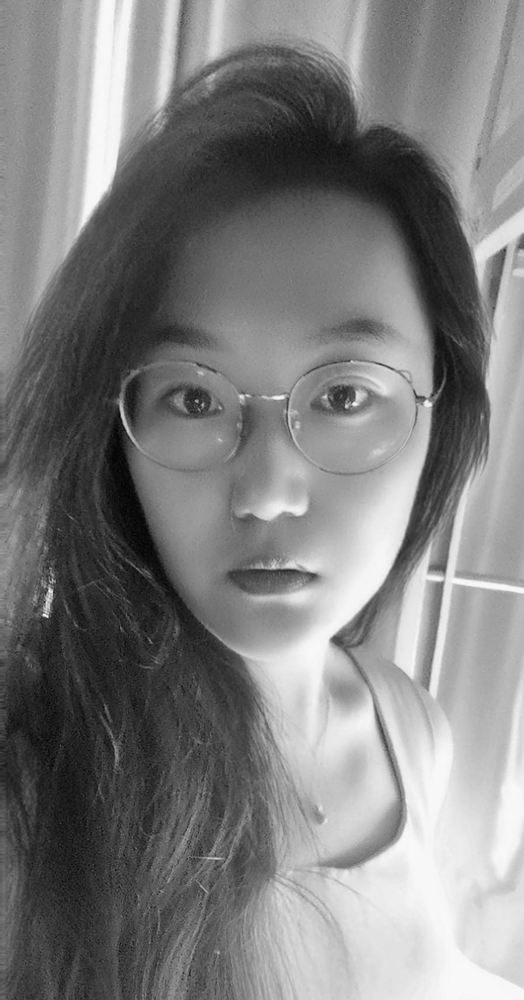

In [41]:
image_gray = ImageOps.grayscale(image) 
image_gray 

In [42]:
image_gray.mode

'L'

- Quantization


**Quantization** : the number of *unique intensity values* any given pixel of the image can take. 
- For a *grayscale* image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize.

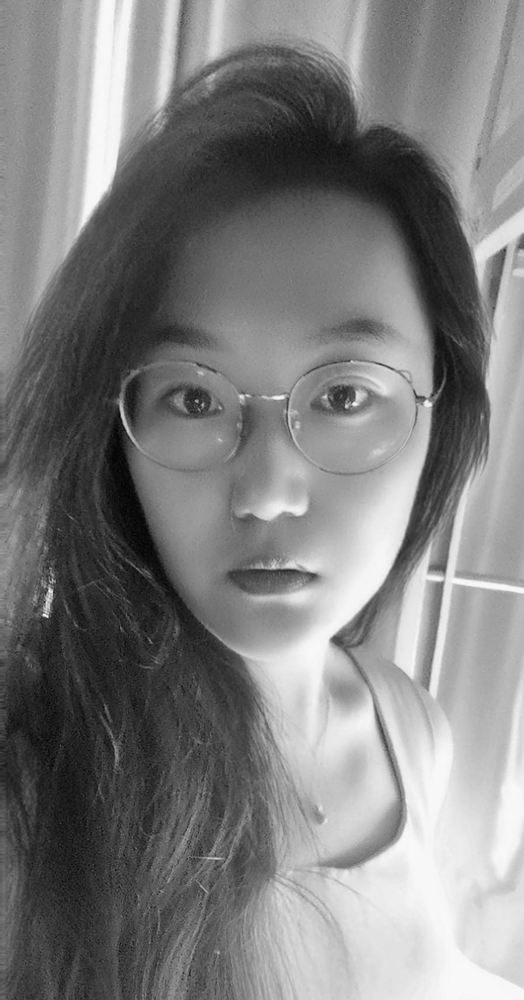

In [44]:
#cut the number of levels in half and observe what happens
image_gray.quantize(256 // 2) 
image_gray #Half the levels do not make a noticable difference.

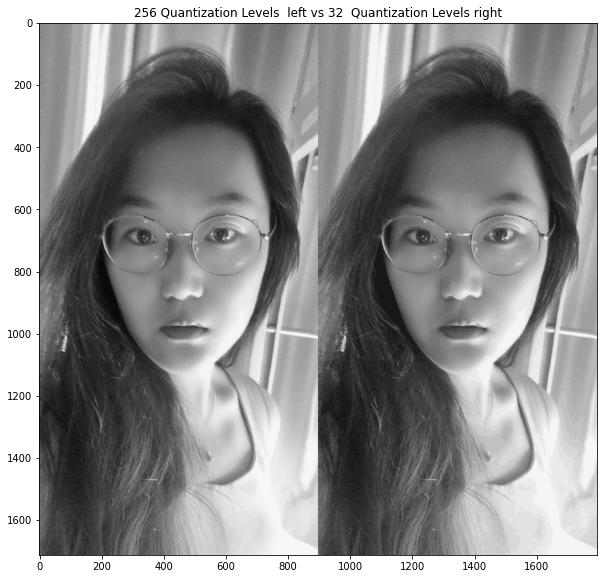

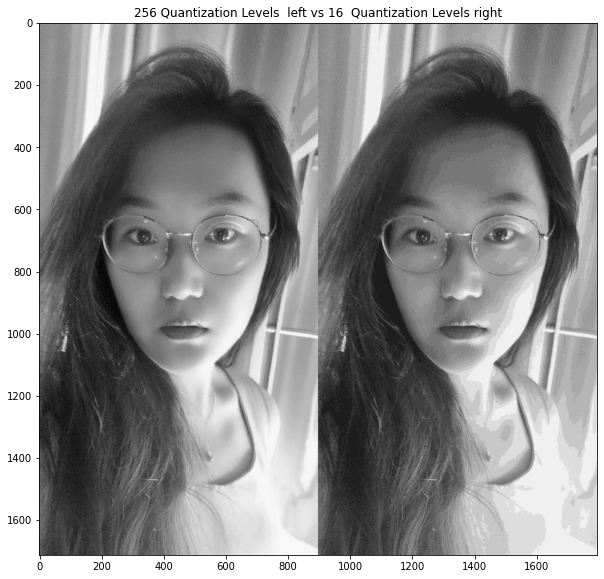

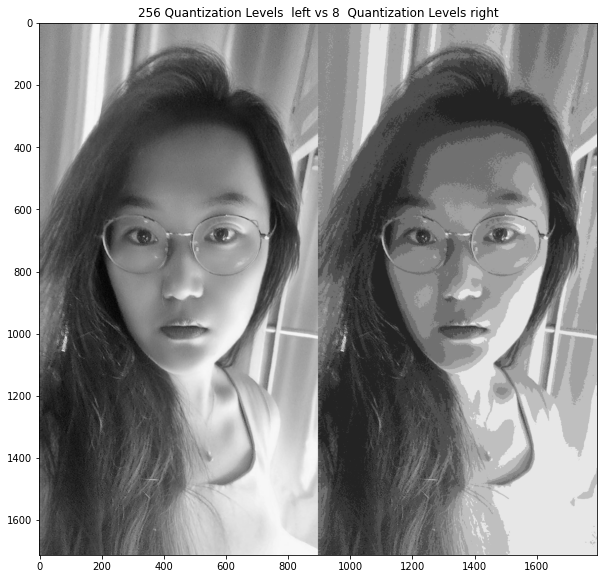

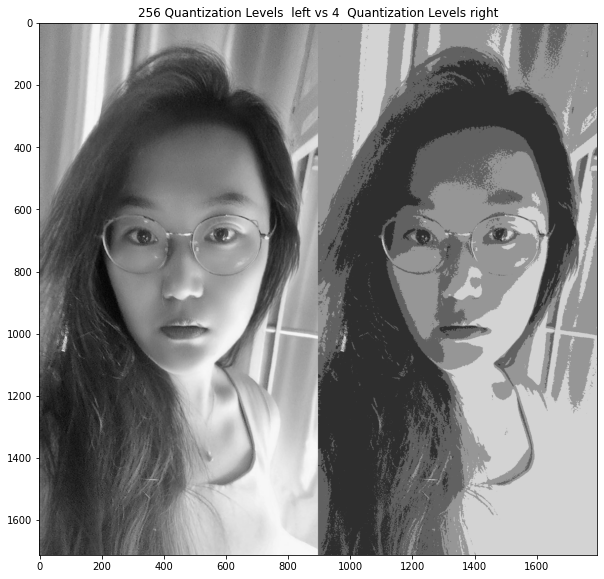

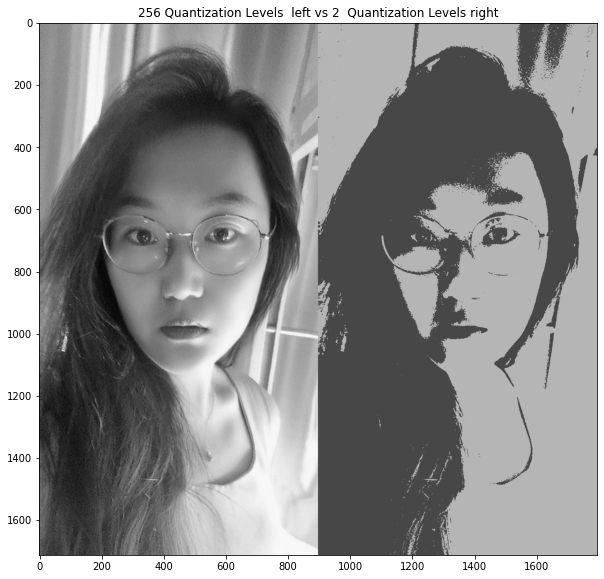

In [45]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show() 
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

- Color Channels

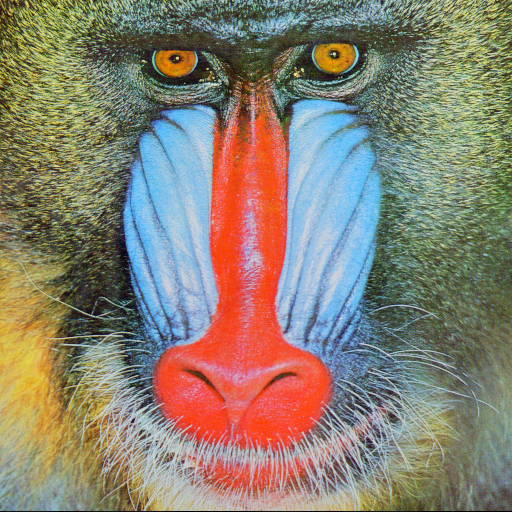

In [46]:
baboon = Image.open('baboon.png')
baboon

In [48]:
#assign RGB color to the variables red, green, and blue:
red, green, blue = baboon.split() 

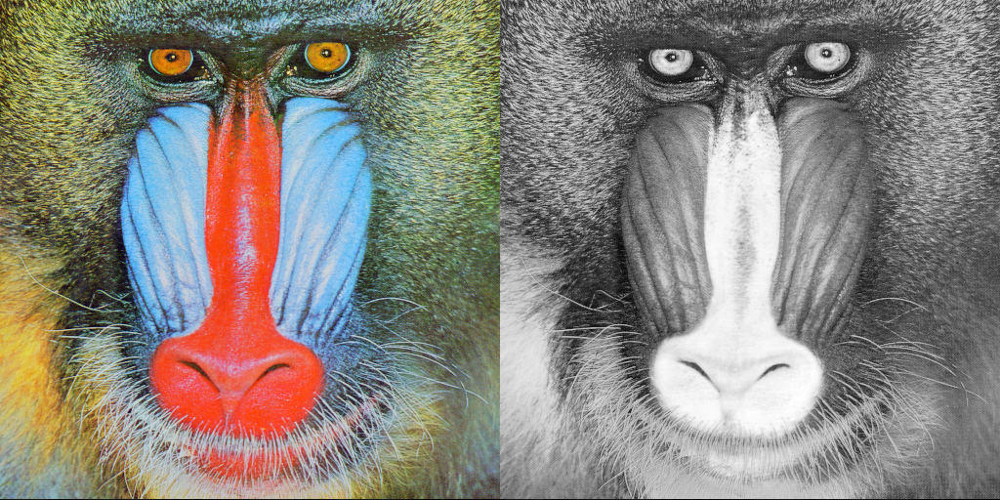

In [49]:
#Plotting image next to the red channel as a grayscale, we see that regions with red have higher intensity values.
get_concat_h(baboon, red)

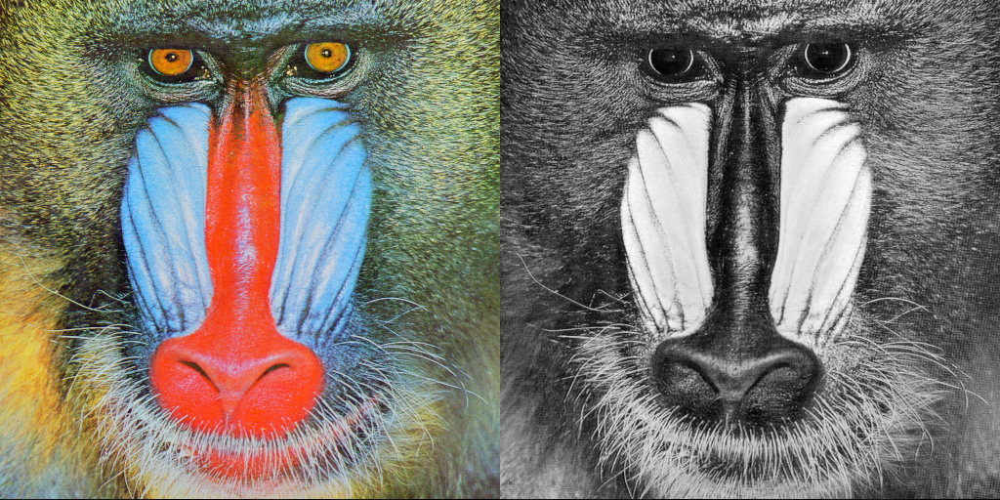

In [50]:
get_concat_h(baboon, blue)

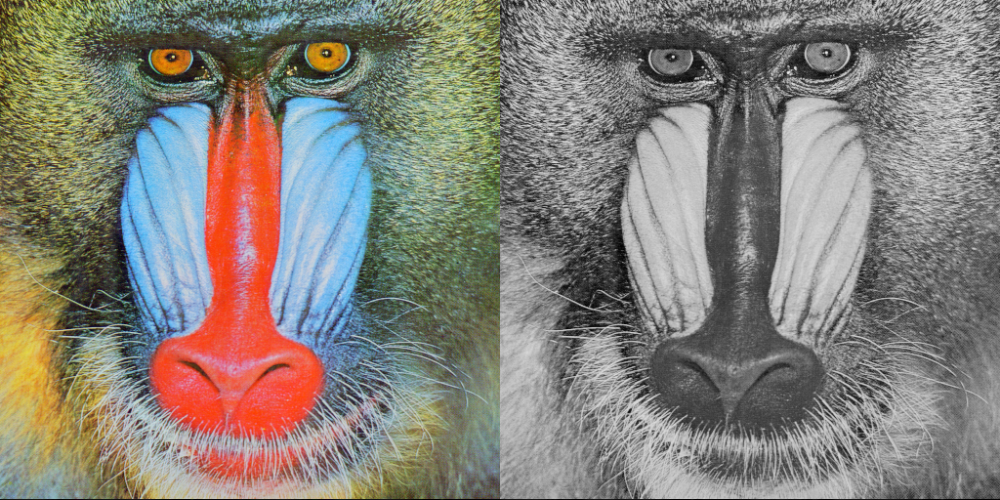

In [51]:
get_concat_h(baboon, green)

# 5)Convert PIL Images into NumPy Arrays

We use `asarray()` or *array function* from NumPy to convert PIL images into NumPy arrays.

In [52]:
import numpy as np
array= np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


In [53]:
#we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate.
#np.array method creates a new copy of the image, such that the original one will remain unmodified.
array = np.array(image)

In [54]:
# summarize shape
print(array.shape)

(1712, 898, 3)


Correspond to `(rows, columns, colors)`

In [55]:
#check the intensity value
print(array)

[[[135 135 143]
  [135 135 143]
  [132 135 142]
  ...
  [148 145 138]
  [151 148 141]
  [151 148 141]]

 [[134 134 142]
  [133 133 141]
  [130 133 140]
  ...
  [149 146 139]
  [152 149 142]
  [152 149 142]]

 [[132 132 140]
  [131 131 139]
  [128 131 138]
  ...
  [152 149 142]
  [152 149 142]
  [152 149 142]]

 ...

 [[126  85  63]
  [126  85  63]
  [127  84  65]
  ...
  [251 247 246]
  [251 247 246]
  [251 247 246]]

 [[125  84  62]
  [125  84  64]
  [127  84  65]
  ...
  [252 246 246]
  [251 247 246]
  [251 247 246]]

 [[123  82  60]
  [123  82  62]
  [125  82  63]
  ...
  [252 246 246]
  [251 247 246]
  [251 247 246]]]


In [56]:
array[0, 0] #The Intensity values are 8-bit unsigned datatype.

array([135, 135, 143], dtype=uint8)

In [57]:
#We can find the maximum and minimum intensity value of the array:
array.min(), array.max()

(0, 255)

- Index

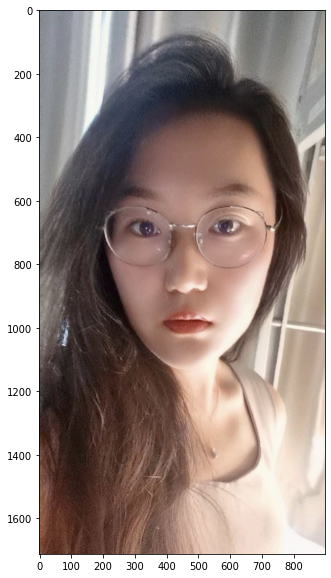

In [58]:
#plot the array as an image:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show()

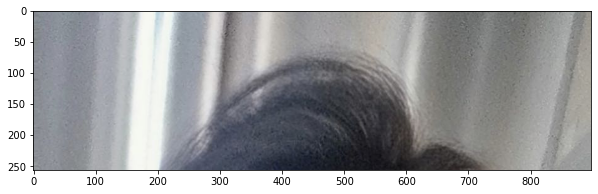

In [59]:
# use numpy slicing,return the first 256 rows corresponding to the top half of the image
rows = 256
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,:])
plt.show()

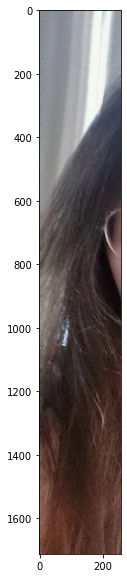

In [60]:
#return the first 256 columns corresponding to the top half of the image
columns = 256
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:columns,:])
plt.show()

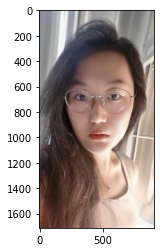

In [61]:
#reassign an array to another variable, use .copy()
A = array.copy()
plt.imshow(A)
plt.show()

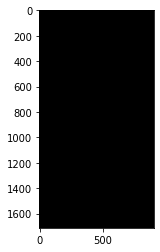

In [62]:
#If we set all values of array A to zero, as B points to A, the values of B will be zero too
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

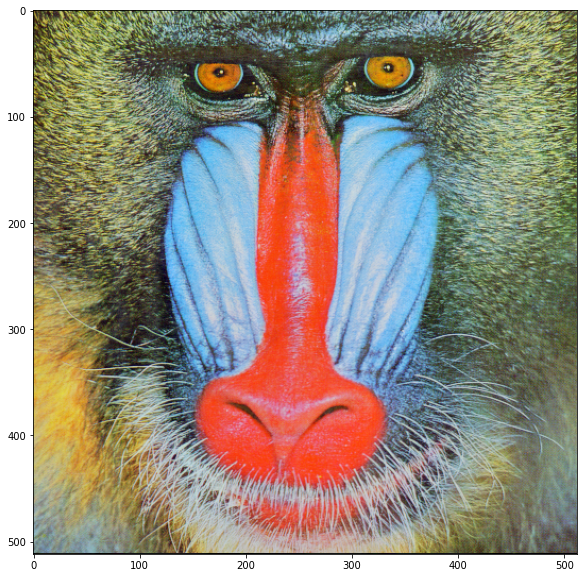

In [63]:
#use baboon photo for different channels
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

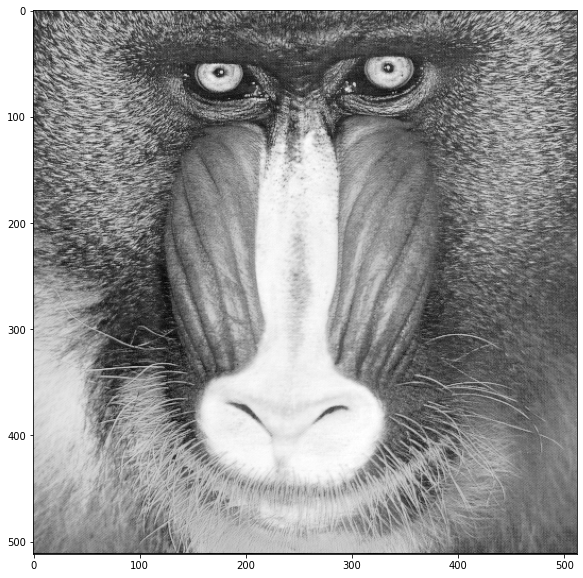

In [64]:
#plot the red channel as intensity values of the red channel.
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

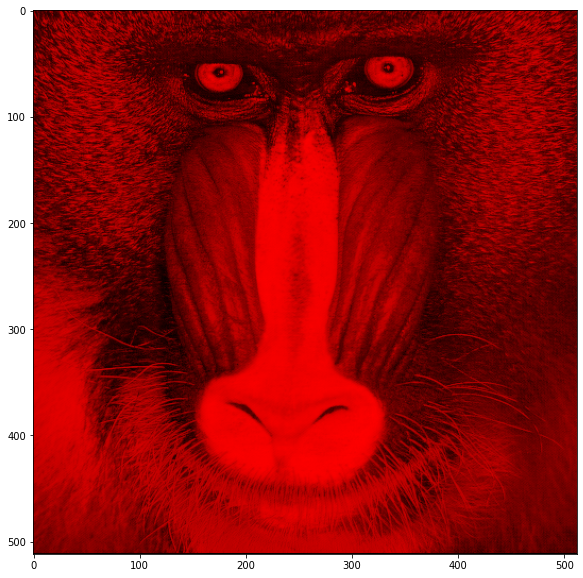

In [65]:
#create a new array and set all but the red color channels to zero
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

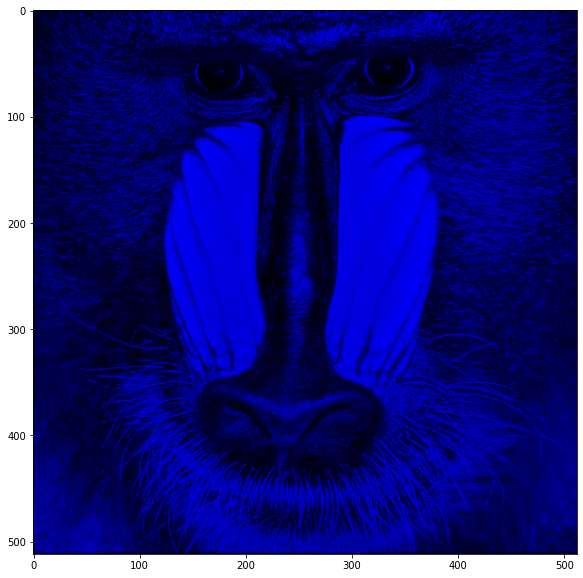

In [66]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()